In [3]:
library(MASS)
set.seed(100)

m <- 3
n <- 2000
sigma <- matrix(c(1, 0.4, 0.2, 0.4, 1, -0.8, 0.2, -0.8, 1), nrow=3) #Covariance matrix
z <- mvrnorm(n, mu=rep(0, m), Sigma=sigma, empirical=T) #2000 samples from 3variate normal,\mu=0, sigma as defined
dim(z)

[1] 2000    3

1.0000000,0.3812244,0.1937548
0.3812244,1.0000000,-0.7890814
0.1937548,-0.7890814,1.0000000


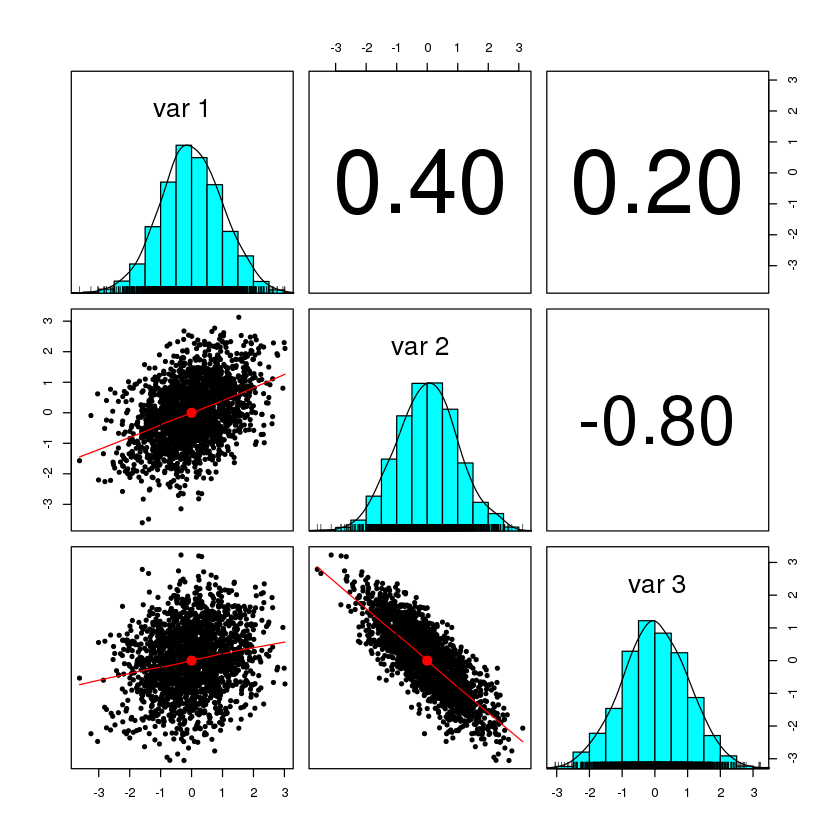

In [7]:
library(psych) #Contains functions that use moments of data to describe them
cor(z, method='spearman') #Given the data it will estimate the covariance matrix using spearman/kendall/pearson
pairs.panels(z) #In the generated figure you see the correlation and examples

In [15]:
#trick: if (X) is a random variable with distribution (F) then (F(X)) is uniformly distributed in the interval [0, 1]. 
u = pnorm(z, mean = rep(0,3), sd = rep(1,3))
dim(u)

[1] 2000    3

1.0000000,0.3812244,0.1937548
0.3812244,1.0000000,-0.7890814
0.1937548,-0.7890814,1.0000000


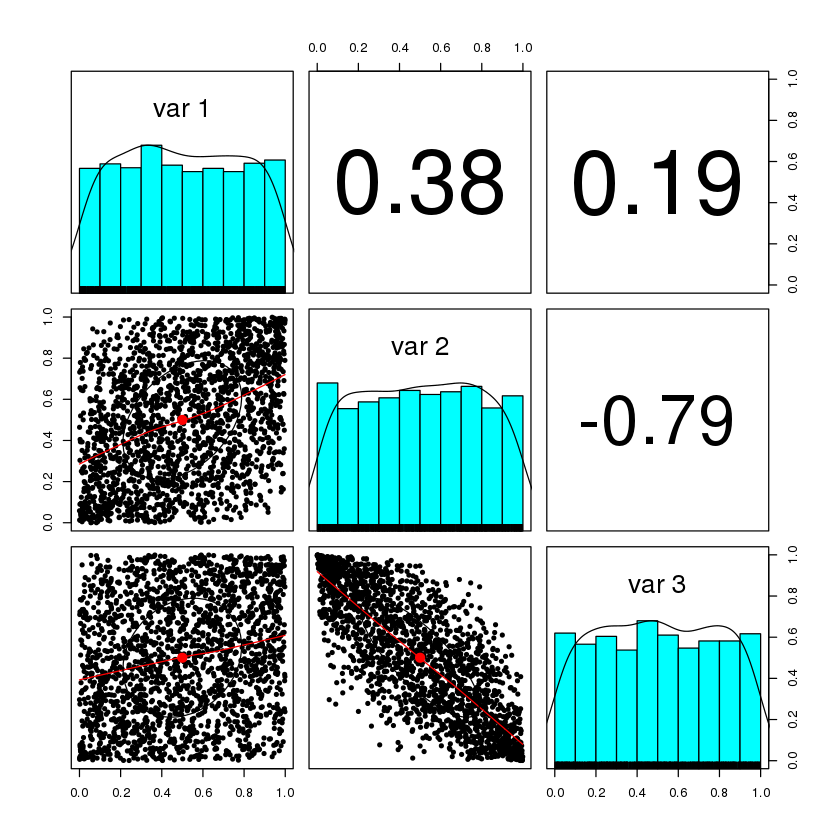

In [18]:
cor(u, method='spearman')
pairs.panels(u)

,x1,x2,x3
x1,1.0000000,0.3812244,0.1937548
x2,0.3812244,1.0000000,-0.7890814
x3,0.1937548,-0.7890814,1.0000000


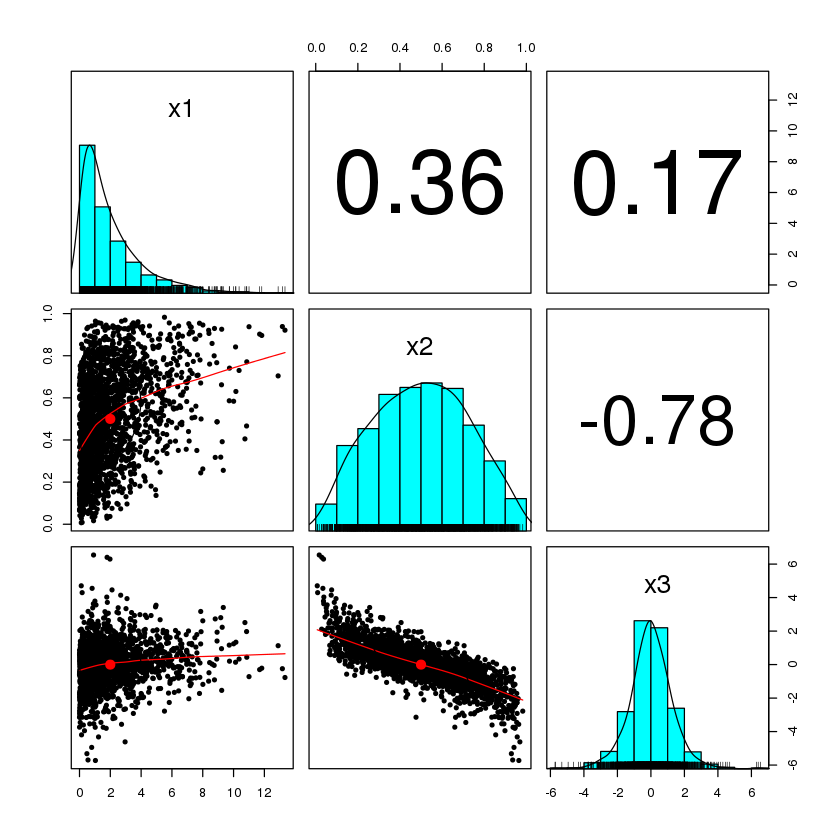

In [25]:
x1 <- qgamma(u[,1],shape=1,scale=2)
x2 <- qbeta(u[,2],2,2)
x3 <- qt(u[,3],df=5)
df <- cbind(x1,x2,x3)
pairs.panels(df)
cor(df,meth='spearman')


Warning message:
: 'rmvdc' is deprecated.
Use 'rMvdc' instead.
See help("Deprecated")

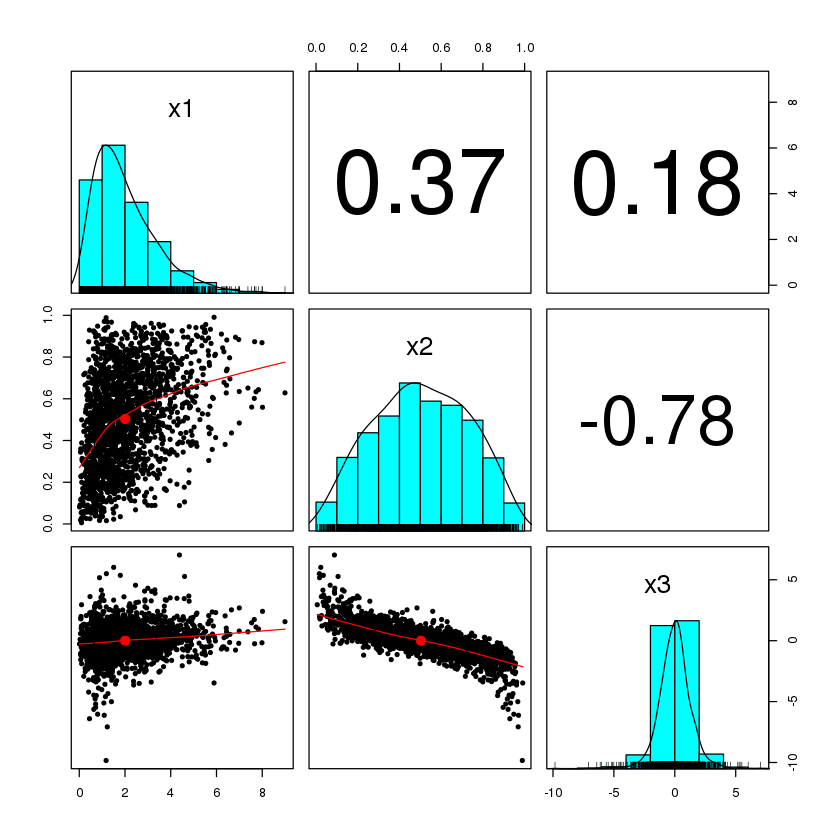

In [31]:
library(copula)
set.seed(100)
myCop <- normalCopula(param=c(0.4,0.2,-0.8), dim = 3, dispstr = "un")
myMvd <- mvdc(copula=myCop, margins=c("gamma", "beta", "t"),paramMargins=list(list(shape=2, scale=1), list(shape1=2, shape2=2), list(df=5)) )
Z2 <- rmvdc(myMvd, 2000)
colnames(Z2) <- c("x1", "x2", "x3")
pairs.panels(Z2)

In [35]:
library(VineCopula)
u <- pobs(as.matrix(Z2))[,1]
v <- pobs(as.matrix(Z2))[,2]

# v <- pobs(as.matrix(cbind(cree,yahoo)))[,2]
selectedCopula <- BiCopSelect(u,v,familyset=NA)
selectedCopula


$p.value.indeptest
[1] NA

$family
[1] 7

$par
[1] 0.3477187

$par2
[1] 1.13102

attr(,"class")
[1] "BiCop"

In [36]:
?BiCopSelect()

BiCopSelect {VineCopula},R Documentation
"u1, u2","Data vectors of equal length with values in [0,1]."
familyset,"Vector of bivariate copula families to select from (the independence copula MUST NOT be specified in this vector, otherwise it will be selected). The vector has to include at least one bivariate copula family that allows for positive and one that allows for negative dependence. Not listed copula families might be included to better handle limit cases. If familyset = NA (default), selection among all possible families is performed. Coding of bivariate copula families: 1 = Gaussian copula 2 = Student t copula (t-copula) 3 = Clayton copula 4 = Gumbel copula 5 = Frank copula 6 = Joe copula 7 = BB1 copula 8 = BB6 copula 9 = BB7 copula 10 = BB8 copula 13 = rotated Clayton copula (180 degrees; “survival Clayton”) 14 = rotated Gumbel copula (180 degrees; “survival Gumbel”) 16 = rotated Joe copula (180 degrees; “survival Joe”) 17 = rotated BB1 copula (180 degrees; “survival BB1”) 18 = rotated BB6 copula (180 degrees; “survival BB6”) 19 = rotated BB7 copula (180 degrees; “survival BB7”) 20 = rotated BB8 copula (180 degrees; “survival BB8”) 23 = rotated Clayton copula (90 degrees) 24 = rotated Gumbel copula (90 degrees) 26 = rotated Joe copula (90 degrees) 27 = rotated BB1 copula (90 degrees) 28 = rotated BB6 copula (90 degrees) 29 = rotated BB7 copula (90 degrees) 30 = rotated BB8 copula (90 degrees) 33 = rotated Clayton copula (270 degrees) 34 = rotated Gumbel copula (270 degrees) 36 = rotated Joe copula (270 degrees) 37 = rotated BB1 copula (270 degrees) 38 = rotated BB6 copula (270 degrees) 39 = rotated BB7 copula (270 degrees) 40 = rotated BB8 copula (270 degrees) 104 = Tawn type 1 copula 114 = rotated Tawn type 1 copula (180 degrees) 124 = rotated Tawn type 1 copula (90 degrees) 134 = rotated Tawn type 1 copula (270 degrees) 204 = Tawn type 2 copula 214 = rotated Tawn type 2 copula (180 degrees) 224 = rotated Tawn type 2 copula (90 degrees) 234 = rotated Tawn type 2 copula (270 degrees)"
selectioncrit,"Character indicating the criterion for bivariate copula selection. Possible choices: selectioncrit = ""AIC"" (default) or ""BIC""."
indeptest,Logical; whether a hypothesis test for the independence of u1 and u2 is performed before bivariate copula selection (default: indeptest = FALSE; see BiCopIndTest). The independence copula is chosen if the null hypothesis of independence cannot be rejected.
level,Numeric; significance level of the independence test (default: level = 0.05).
weights,Numerical; weights for each observation (optional).
rotations,"If TRUE, all rotations of the families in familyset are included."
family,The selected bivariate copula family.
"par, par2",The estimated bivariate copula parameter(s).
p.value.indeptest,P-value of the independence test if performed.
